# Анализ рынка общественного питания в Москве

В данной работе нам предстоит проанализировать рынок общественного питания в Москве с целью выявить особенности рынка и ответить на поставленные вопросы:
* Какие категории заведений преобладают в Москве?
* Какие категории заведений чаще являются сетевыми? 
* Какие сети самые популярные в Москве?
* В каких районах Москвы самый высокий средний чек?
и другие.

В части предобработки мы проверим, есть ли в датафрейме пропуски или дубликаты, добавим новые столбцы при необходимости. Подготовим данные для дальнейшего анализа.

В аналитической части мы ответим на вышепоставленные вопросы, построим графики и наглядно посмотрим на представленные данные. Проанализируем рынок кофеен.

**План проекта:**

1. [Изучение датафрейма](#Изучение-датафрейма)
2. [Предобработка данных](#Предобработка-данных)
    1. [Обработка дубликатов и пропусков](#Обработка-дубликатов-и-пропусков)
    2. [Добавление новых столбцов](#Добавление-новых-столбцов)
    3. [Вывод](#Вывод)
3. [Анализ данных](#Анализ-данных)
    1. [Количество заведений по категориям](#Количество-заведений-по-категориям)
    2. [Среднее количество посадочных мест](#Среднее-количество-посадочных-мест)
    3. [Сетевые и несетевые заведения](#Сетевые-и-несетевые-заведения)
    4. [Административные районы Москвы](#Административные-районы-Москвы)
    5. [Средний рейтинг по категориям заведений](#Средний-рейтинг-по-категориям-заведений)
    6. [Хороплет со средним рейтингом заведений](#Хороплет-со-средним-рейтингом-заведений)
    7. [Расположение всех заведений на карте](#Расположение-всех-заведений-на-карте)
    8. [Топ улиц с наибольшим количеством заведений](#Топ-улиц-с-наибольшим-количеством-заведений)
    9. [Улицы с одним заведением](#Улицы-с-одним-заведением)
    10. [Средний чек заведений по районам](#Средний-чек-заведений-по-районам)
    11. [Исследование кофеен](#Исследование-кофеен)
4. [Выводы и рекомендации](#Выводы-и-рекомендации)

**Описание данных:**
* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах;
* `price` — категория цен в заведении;
* `avg_bill` — средняя стоимость заказа в виде диапазона;
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`;
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`;
* `chain` — является ли заведение сетевым;
* `district` — административный район, в котором находится заведение;
* `seats` — количество посадочных мест.

## Изучение датафрейма

In [1]:
# Импорт библиотек

import pandas as pd
import scipy.stats as st
import datetime as dt
import time
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import math as mth
import plotly.express as px
import folium
from folium import Map, Choropleth
import json 
from folium import Marker, Map
from folium.plugins import MarkerCluster

In [2]:
# Загрузка датасета

data = pd.read_csv(r'C:\Users\ivank\practicum\datasets\moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В таблице 14 столбцов:
1. `name` — название заведения;
2. `address` — адрес заведения;
3. `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
4. `hours` — информация о днях и часах работы;
5. `lat` — широта географической точки, в которой находится заведение;
6. `lng` — долгота географической точки, в которой находится заведение;
7. `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
8. `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
9. `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
   * «Средний счёт: 1000–1500 ₽»;
   * «Цена чашки капучино: 130–220 ₽»;
   * «Цена бокала пива: 400–600 ₽».
    и так далее;


10. `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
   * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.


11. `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
   * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.


12. `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   * 0 — заведение не является сетевым
   * 1 — заведение является сетевым


13. `district` — административный район, в котором находится заведение, например Центральный административный округ;
14. `seats` — количество посадочных мест.

Типы данных в датафрейме представлены верно за исключением последнего столбца, количество посадочных мест не может быть дробным числом.
Посмотрим, сколько заведений попало в датафрейм. Отсортируем количество заведений по адресу, так как названия сетевых заведений могут повторяться.

In [5]:
data[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'chain', 'seats']].describe().round(2)

,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,3149.00,535.00,8406.00,4795.00
mean,4.23,958.05,174.72,0.38,108.42
std,0.47,1009.73,88.95,0.49,122.83
min,1.00,0.00,60.00,0.00,0.00
25%,4.10,375.00,124.50,0.00,40.00
50%,4.30,750.00,169.00,0.00,75.00
75%,4.40,1250.00,225.00,1.00,140.00
max,5.00,35000.00,1568.00,1.00,1288.00


Рейтинг заведений колеблется от 1 до 5, однако большинство заведений (более 75%) имеют рейтинг выше 4. Средний чек находится в диапозоне от 0 до 35 тыс. рублей. Обе эти суммы кажутся подозрительными, в первом случае, вероятно, не было данных о среднем чеке, а во втором, возможно, при загрузке ошиблись цифрой, может быть реальная средний чек для данного заведения - 3500р. Средняя цена чашки кофе колеблется от 60 до 1568 рублей, но средняя цена в районе 170-175 рублей. Большинство заведений являеются несетевыми, к сетям относятся около 38% заведений. Количество посадочных мест варьируется от 0 до 1288. 0 посадочных мест может быть в кофейнях навынос, а вот более тысячи мест это точно ошибка.

In [6]:
data[data['middle_avg_bill']>10000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


In [7]:
print('Количество уникальных заведений в датафрейме:', data['address'].nunique())

Количество уникальных заведений в датафрейме: 5753


In [8]:
print(data['category'].unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


Итак, в таблице представлено 14 столбцов с информацией по 5753 заведениям. Кождому заведению присвоен один из типов:
* `кафе`
* `ресторан`
* `кофейня`
* `пиццерия`
* `бар,паб`
* `быстрое питание`
* `булочная`
* `сторловая`

В нашем распоряжении датафрейм, содержащий информацию о 5753 заведениях различных категорий в Москве. Типы данных верны, однако можно заметить присутствие пропусков в некоторых столбцах таблицы. Перейдем к предобработке.

[Начало страницы](#Анализ-рынка-общественного-питания-в-Москве)

## Предобработка данных

### Обработка дубликатов и пропусков

In [9]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


Явных дубликатов в таблице не оказалось, проверим, есть ли неявные дубликаты. Приведем названия заведений и адреса к нижнему регистру и сверим информацию попарно.

In [10]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data.duplicated(subset=['name', 'address']).sum()

4

В таблице оказалось 4 неявых дубликата, нужно от них избавиться.

In [11]:
data = data.drop_duplicates(subset=['name', 'address'])
data.duplicated(subset=['name', 'address']).sum()

0

Теперь в таблице нет дубликатов, кроме повторяющихся названий заведений. В данных есть сетевые заведения, которые могут называться одинаково, поэтому удалять эти строки будет некорректно.

In [12]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Во многих столбцах в данных присутствуют пропуски. Возможно, утеря данных произошла при некорректом переносе данных, а возможно этой информации просто и не было в открытых источниках и ее никто не заполнял.

Так, например, в 536 заведениях не указано время работы, также присутствуют пропуски в столбцах с ценовой категорией заведений, средним чеком на меню и на кофе, а также в некоторых заведениях не указано количество посадочнх мест. Поскольку мы не можем восстановить никакие из этих данных, а также удалять строки с отсутствующими данными, ведь может удалиться большая часть датафрейма, остается только оставить пропуски.

Также, поскольку в столбце с количеством посадочных мест есть пропуски, мы не можем изменить тип данных на целые числа, так как `int` не принимает `NaN`.

### Добавление новых столбцов

In [13]:
data['street'] = data['address'].str.split(', ').str[1]
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [14]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


В таблицу добавлены 2 новых столбца:
* `street` - улица, на которой расположено заведение;
* `is_24/7` - столбец с обозначением, если заведение работает ежедневно и круглосуточно.

### Вывод

[Начало страницы](#Анализ-рынка-общественного-питания-в-Москве)

## Анализ данных

### Количество заведений по категориям

Проверим, какие заведения преобладают в Москве. 

In [15]:
categories = data.pivot_table(index='category', values='name', aggfunc='count'
                             ).sort_values(by='name', ascending=False).reset_index()
categories.columns = ['category', 'count']
display(categories)

fig = px.bar(categories, x='category',  y='count', title='Количество заведений по категориям', 
             labels={'category':'Категории', 'count':'Количество объектов'})

fig.show() 

,category,count
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Наиболее встречаемое заведение в Москве - это `кафе`, которых в столице 2376. На втором и третьем месте `рестораны` и `кофейни`, их 2042 и 1413 соответственно. Наименее популярные заведеня это `столовые` и `булочные`, их насчитывается около 315 и 256 соответственно

### Среднее количество посадочных мест

Прежде, чем считать среднее количество посадочных мест, детальнее изучим информацию об этом столбце в таблице.

In [16]:
data['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Заведениями с 0 посадочных мест могут быть кофейни и булочные, работающие на выдачу. Но также есть заведения, где мест слишком много. Чтобы не учитывались эти выбросы, посчитаем среднее количество мест по медиане.

In [17]:
seats = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round()
display(seats)

fig = px.bar(seats, x='category',  y='seats', title='Среднее количество посадочных мест в заведениях по категориям',
             labels={'category':'Категории', 'seats':'Количество мест'})
fig.show() 

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,76.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


Больше всего посадочных мест в заведениях категорий `ретсоран` - в среднем около 86 посадочнх мест, и `паб, бар` - около 82 посадочных мест. На третьем месте `кофейни`,  в них около 80 посадочных мест.

Наименее вместимыми оказались `пиццерия` и `булочная`, в них 55 и 50 мест соответственно.

Данное распределение может быть свзяно с тем, что чаще в барах и ресторанах люди проводят больше времени, соответственно заведению нужно больше мест, чтобы разместить гостей. Пиццерия это вид фаст фуда, что говорит само за себя, люди уходят после того как поели, в булочные и вовсе часто заходят купить позиции навынос.

### Сетевые и несетевые заведения

In [18]:
data['chain'].value_counts()

0    5199
1    3203
Name: chain, dtype: int64

По таблице видно, что несетевые заведения встречаются чаще. Посмотрим график соотношения заведений для наглядности.

In [19]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=data['chain'].value_counts(), \
                             title='Соотношение сетевых и несетевых заведений')])
fig.show()

По графику видно, что несетевых заведений в Москве больше половины. Сетевые заведения составляют примерно 38% от общего числа заведений. Посмотрим, какие категории заведений чаще являются сетевыми.

In [20]:
chain = categories.merge(data.groupby(by='category')['chain'].sum(), on='category', how='inner')
chain['no_chain'] = chain['count'] - chain['chain']
chain['percentage'] = (chain['chain'] / chain['count'] * 100).round(2)
chain = chain.sort_values(by='percentage', ascending=False).reset_index(drop=True)
chain

,category,count,chain,no_chain,percentage
0,булочная,256,157,99,61.33
1,пиццерия,633,330,303,52.13
2,кофейня,1413,720,693,50.96
3,быстрое питание,603,232,371,38.47
4,ресторан,2042,729,1313,35.70
5,кафе,2376,779,1597,32.79
6,столовая,315,88,227,27.94
7,"бар,паб",764,168,596,21.99


In [21]:
fig = px.bar(chain, x='category',  y='percentage', title='Процент сетевых заведений по категориям',
             labels={'category':'Категории', 'percentage':'Процент'})
fig.update_xaxes(tickangle=0)
fig.show() 

Чаще всего сетевыми являются: `булочные` (61%), `пиццерии` (52%) и `кофейни` (51%). Меньше всего сетевых заведений среди `пабов и баров` - около 22%.

Рассмотрим, какие сети являются самыми популярными.

In [22]:
top_chain = data.query('chain == 1')

top_chain = top_chain.groupby('name').agg({'category' : pd.Series.mode, 'address' : 'count'}
                                         ).sort_values(by='address', ascending=False).reset_index().head(15)
top_chain.rename(columns = {'address':'count'}, inplace=True)
top_chain

,name,category,count
0,шоколадница,кофейня,120
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,кафе,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


In [23]:
fig = px.bar(top_chain.sort_values(by='count'), x='count', y='name', title='Топ-15 популярных сетевых заведений',
             labels={'name':'Название сети', 'count':'Количество объектов'})
fig.show()

Больше всего заведений имеет сеть `Шоколадница` (кофейня) и насчитывает около 120 заведений в Москве. Пиццерии сети `Додо`, `Домино'с пицца` и кофейня `One Price` Coffee насчитывают 71-76 заведений. Наименее популярной сетью в топ_15 оказалось кафе `Му-му`, с 27 заведениями по Москве.

In [24]:
top_chain['category'].value_counts()

кофейня     5
кафе        4
ресторан    3
пиццерия    2
булочная    1
Name: category, dtype: int64

По таблице видно, что в основном в топе находятся кофейни и кафе, и суммарно составляют больше половины сетей из топа.

### Административные районы Москвы

In [25]:
print('Количество районов в датасете:', data['district'].nunique(), data['district'].unique())

Количество районов в датасете: 9 ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


В датафрейме представлены 9 административных округов Москвы. Посмотрим сколько заведений находится в каждом округе.

In [26]:
all_distr = data['district'].value_counts().reset_index()
all_distr.columns = ['district', 'count']
all_distr

,district,count
0,Центральный административный округ,2242
1,Северный административный округ,898
2,Южный административный округ,892
3,Северо-Восточный административный округ,890
4,Западный административный округ,850
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [27]:
fig = go.Figure(data=[go.Pie(labels=all_distr['district'], values=all_distr['count'], \
                             title='Количество заведений по районам')])
fig.show()

На графике видно, что больше четверти всех заведений, а именно около 27%, располагаются в Центральном районе. В центре обычно наибольшее скопление людей, туристов, большая проходимость, также средний чек намного выше, что позволяет завысить цены.

Северный, Южный, Северо-Восточный и Западные округа имеют примерно одинаковую долю, около 10.1%-10.7% от общего числа заведений. Самым немногочисленным по количеству заведений оказался Северо-Западный округ, в нем находится около 4.8% заведений.

Посмотрим на распределение категорий заведений по районам.

In [28]:
districts = data.groupby(by=['district', 'category']).agg({'address':'count'}
                                        ).rename(columns={'address':'count'}).sort_values(by='count', ascending=False
                                                                                         ).reset_index()
districts.head(10)

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
5,Восточный административный округ,кафе,272
6,Северо-Восточный административный округ,кафе,269
7,Южный административный округ,кафе,264
8,Западный административный округ,кафе,238
9,Юго-Западный административный округ,кафе,238


In [29]:
districts_pivot = districts.pivot_table(index='district', columns='category', values='count')
districts_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,234,193,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [30]:
fig = px.bar(districts.sort_values(by='count', ascending=True), y='district', x='count', color='category',
            title='Количество заведений по административным округам в Москве', 
             labels={'district':'Округа', 'count':'Количество объектов'})
fig.show()

По графику видно, что категории заведений расположены достаточно равномерно по всем округам. Нельзя выделить категории, которые бы преобладали в определенных районах.

### Средний рейтинг по категориям заведений

Проверим, какие категории получают более высокие оценки пользователей, а какие более низкие.

In [31]:
rating = data.groupby('category').agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False).reset_index()
rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [32]:
fig = px.bar(rating.sort_values(by='rating', ascending=True), y='category', x='rating', text = 'rating',
            title='Средний рейтинг по категориям заведений', 
             labels={'category':'Категория', 'rating':'Рейтинг'})
fig.update_xaxes(range=[4, 4.5])
fig.show()

Средние оценки всех категорий держатся в диапозоне 4.05-4.39 баллов. Наивысшие оценки получают заведения категории `паб, бар` - средний рейтинг 4.39. `Пиццерии`, `рестораны`, `кофейни` и `булочные` находятся примерно на одном уровне, их рейтинг в диапозоне 4.27-4.3. Самые низкие оценки получают заведения `быстрого питания` - средний рейтинг 4.05.

### Хороплет со средним рейтингом заведений

Построим фоновую карту, чтобы наглядно увидеть, в каком районе заведения получают более высокие оценки.

In [33]:
rating_geo = data.groupby('district').agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False).reset_index()
rating_geo

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [34]:
# загружаем JSON-файл с границами округов Москвы
moscow_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_geo,
    data=rating_geo,
    columns=['district', 'rating'],
    key_on='feature.name',
    range_color=(4.0, 4.5),
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# вывод карты
m

По карте видно, что самые высокие оценки получают заведения в Центральном районе, однако и заведений там гораздо больше, чем в остальных районах. Самые низкие оценки у заведений, расположенных в Юго-Восточном округе.

### Расположение всех заведений на карте

In [35]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

По карте видно, что самые многочисленные кластеры складываются к центру Москвы, как раз где и располагается основная масса завежений.

### Топ улиц с наибольшим количеством заведений

Создадим Топ-15 улиц, на которых располагается больше всего заведений.

In [36]:
top_streets = data.groupby(by='street').agg({'address':'count'}
                                        ).rename(columns={'address':'count'}).sort_values(by='count', ascending=False
                                                                                         ).reset_index().head(15)
top_streets

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Улицей, с самым большим количеством заведений (184), оказался проспект Мира, протяженность которого составляет около 9км, то есть на каждый километр этой улицы приходится около 20 заведений. На втором месте Профсоюзная улица, на которой расположились 122 заведения, далее идут проспект Вернадского и Ленинский проспект с 108 и 107 заведениями соответственно. Самой немногочисленной улицей из топа оказалась Пятницкая улица и 48 заведений, однако протяженность этой улицы всего 1.8 км, то есть плотность расположения заведений на этой улице выше, чем на проспекте Мира.

Рассмотрим, какие категории заведений располагаются на этих улицах.

In [37]:
streets = data.groupby(by=['street', 'category']).agg({'address':'count'}
                                        ).rename(columns={'address':'count'}).sort_values(by='count', ascending=False
                                                                                         ).reset_index()
streets.head()

,street,category,count
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35


In [38]:
streets = streets[streets['street'].isin(top_streets['street'])]
streets.pivot_table(index='street', columns='category', values='count')

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
мкад,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


In [39]:
fig = px.bar(streets, x='count', y='street', color='category',
            title='Количество заведений по улицам в Москве', 
             labels={'street':'Улицы', 'count':'Количество объектов'})
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Как и в ситуации с округами, на всех улицах различные категории представлены довольно равномерно, за исключением МКАДа. На МКАДе абсолютное число заведений занимают кафе. Поскольку МКАД это магистральная высокоскоростная улица, формат баров или ресторанов здесь не очень подходит, чаще люди останавлияются перекусить и едут дальше, поэтому на втором месте после кафе на МКАДе популярные заведения быстрого питания.

### Улицы с одним заведением

В датафрейме также есть улицы, на которых расположено всего по одному заведению. Посмотрим, сколько таких улиц и какие заведения обычно на них располагаются.

In [40]:
one_rest_street = data['street'].value_counts().reset_index()
one_rest_street = one_rest_street[one_rest_street['street']==1]
one_rest_street.columns = ['street', 'count']
one_rest_street = one_rest_street.reset_index(drop=True)
print('Количество улиц с одним заведением:', one_rest_street['street'].count())
one_rest_street.head()

Количество улиц с одним заведением: 457


,street,count
0,талдомская улица,1
1,улица фотиевой,1
2,2-й верхний михайловский проезд,1
3,3-й михалковский переулок,1
4,малая тульская улица,1


Всего в датафрейме 458 улиц, на которых расположено по одному заведению. Посмотрим, есть ли между ними что-то общее.

In [41]:
ors_data = data[data['street'].isin(one_rest_street['street'])].reset_index()
ors_data.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
1,21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
2,25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
3,58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
4,60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False


In [42]:
print('Количество круглосуточных заведений на улицах с одним объектом:', ors_data['is_24/7'].sum(), 'или', 
      f"{ors_data['is_24/7'].sum()/ors_data['is_24/7'].count():.0%}")

Количество круглосуточных заведений на улицах с одним объектом: 31 или 7%


In [43]:
print('Средний рейтинг заведений на улицах с одним объектом:', round(ors_data['rating'].mean(), 2))

Средний рейтинг заведений на улицах с одним объектом: 4.24


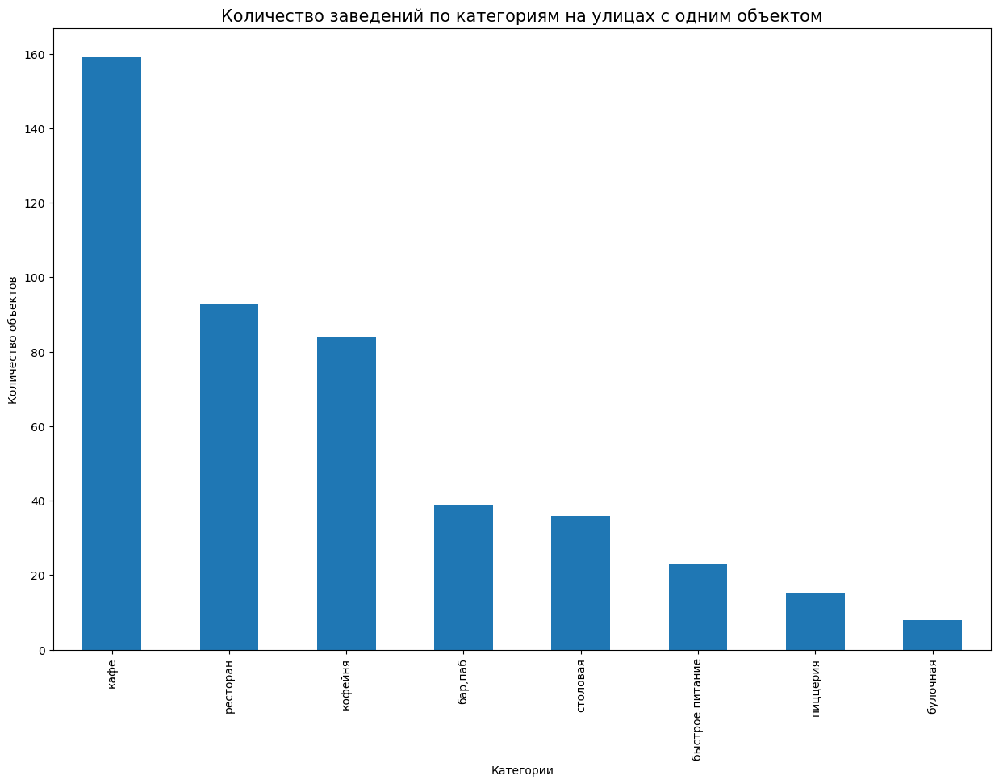

In [44]:
ors_data['category'].value_counts().plot(kind='bar', legend='', 
                                         xlabel='Категории', ylabel='Количество объектов', figsize=(15,10))
plt.title('Количество заведений по категориям на улицах с одним объектом', size = 15)
plt.show()

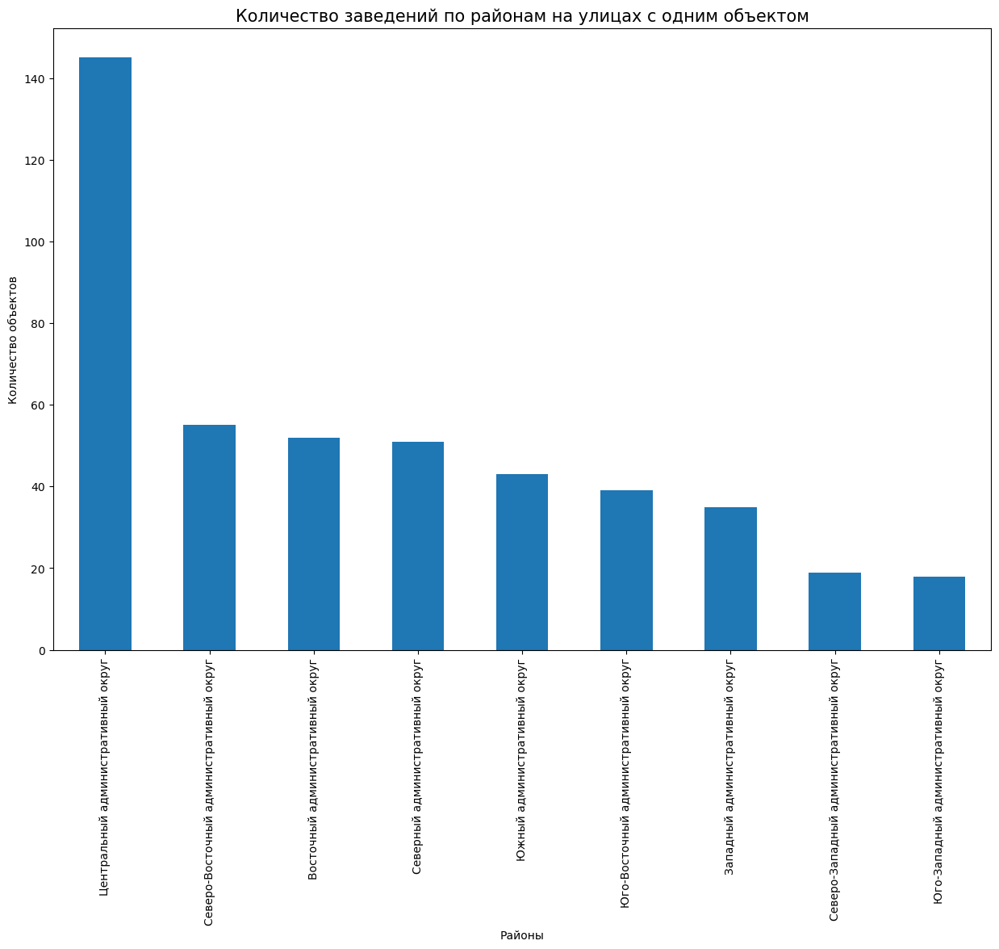

In [45]:
ors_data['district'].value_counts()
ors_data['district'].value_counts().plot(kind='bar', legend='', 
                                         xlabel='Районы', ylabel='Количество объектов', figsize=(15,10))
plt.title('Количество заведений по районам на улицах с одним объектом', size = 15)
plt.show()

По графикам видно, что данные заведения никак не отличаются от основной массы. Среди них всего 7% работают круглосуточно, средний рейтинг этих заведений составляет 4.24, а основная их масса оносится к кафе и располагается в центральном районе. Примерно такие же результаты мы увидели и в остальных случаях.

### Средний чек заведений по районам

Построим фоновую картограмму и посмотрим, в каких районах самый высокий и низкий средние чеки.

In [46]:
district_bill = data.groupby(by='district').agg({'middle_avg_bill':'median'}).reset_index()
district_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [47]:
# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_geo,
    data=district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# вывод карты
m

По карте можно заметить, что самые высокие средние чеки выходят в заведениях расположенных, как и ожидалось, в Центральном районе и в Западном районе. Самый низкий средний чек в заведениях, расположенных в Юго-Восточном округе.

### Исследование кофеен

Далее более подробно разберем кофейни.

In [48]:
coffee_h = data[data['category'] == 'кофейня']
print('Всего кофеен в датасете:', coffee_h['address'].count())

Всего кофеен в датасете: 1413


In [49]:
coffee_distr = coffee_h['district'].value_counts().reset_index()
coffee_distr

,index,district
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Как и ожидалось, больше всего коффен расположено в центральном районе. Посмотрим, как это выглядит на карте.

In [50]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_h.apply(create_clusters, axis=1)

# выводим карту
m

Чем ближе к центру, тем кластеры становятся более многочисленными. По карте можно увидеть, что ближе ко МКАДу остается совсем немного кофеен, вероятно в этих областях кофейни не пользуются спросом.

Посмотрим, есть ли в таблице данные о круглосуточнх кофейнях.

In [51]:
fig = go.Figure(data=[go.Pie(labels=['Не круглосуточные', 'Круглосуточные'], values=coffee_h['is_24/7'].value_counts(), \
                             title='Соотношение сетевых и несетевых заведений')])
fig.show()

Почти 96% всех коффен не работают круглосуточно, однако, есть ряд заведений, работающих и ночью. Интересно посмотреть, где они располагаются.

In [52]:
coffee_24 = coffee_h[coffee_h['is_24/7']==True]

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24.apply(create_clusters, axis=1)

# выводим карту
m

Большинство круглосуточных коффен в основном находятся в центре, в остальных районах это единичные случаи. В центре и ночью можно встретить людей, жалеющих выпить чашку кофе или купить что-то перекусить, однако не совесм целесообразно работать ночью и в будние дни, так как в основном люди гуляют по ночной Москве на выходных.

In [53]:
coffee_rating = coffee_h.groupby('district').agg({'rating':'mean'}
                                                ).round(2).sort_values(by='rating', ascending=False).reset_index()
display(coffee_rating)
print('Средний рейтинг коффен:', round(coffee_rating['rating'].mean(), 2))

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Восточный административный округ,4.28
4,Юго-Западный административный округ,4.28
5,Юго-Восточный административный округ,4.23
6,Южный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


Средний рейтинг коффен: 4.27


В целом у коффен довольно неплохой рейтинг, по районам колеблется в диапозоне 4.2-4.34, а средний рейтинг всех коффен составляет 4.27. Посмотрим более нагладно на карте, как распределены рейтинги.

In [54]:
# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    range_color=(4.0, 4.5),
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# вывод карты
m

Самые высокие рейтинги у кофеен в Центральном и Северно-Западном районах. Самые низкие - в Западном и Северо-Восточном районах.

Посмотрим какая средняя цена на чашку кофе в кофейнях по районам.

In [55]:
coffee_bill = coffee_h.groupby(by='district').agg({'middle_coffee_cup':'median'}).reset_index()
display(coffee_bill)
print('Средняя цена чашки кофе:', round(coffee_bill['middle_coffee_cup'].mean(), 2))

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


Средняя цена чашки кофе: 166.22


In [57]:
# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=moscow_geo,
    data=coffee_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе по районам',
).add_to(m)

# вывод карты
m

Самый дорогой кофе можно купить в Центральном, Западном и Юго-Западном районах. Средняя цена чашки кофе по Москве - 166 рублей, что для столицы довольно недорого. На различия в цене может влиять много факторов, например, стоимость аренды помещения, уровень конкурентности, какой среднестатистический покупатель в этом районе.

[Начало страницы](#Анализ-рынка-общественного-питания-в-Москве)

## Выводы и рекомендации

**Проделав данную работу, можно сформулировать несколько выводов:**
* Наиболее популярные категории заведений в Москве - `рестораны`, `кафе` и `кофейни`;
* Несетевых заведений больше, чем сетевых. Самое популярное сетевое заведение - `Шоколодница`;
* Основная масса заведений (26%) располагается в `Центральном` районе;
* Самый высокий рейтинг у заведений в `Центральном` районе;
* Самый высокий средний чек в `Центральном` и `Западном` районах.

**Рекомендации по кофейням:**

Больше всего кофеен расположены в Центральном районе Москвы, соответственно,в этом районе самая высокая конкурентность. Помимо Центрального района, в Западном и Юго-Западном районах более высокая средняя стоимость чашки кофе, можно расположиться в одном из этих районов.

Также, в этих районах мало круглосуточных кофеен, можно выбрать расположение в этих районах но ближе к центру, где люди гуляют по ночам, на первое время можно работать круглосуточно только в выходные, чтобы понять целесообразность круглосуточной работы кофейни. 

Средняя цена кофе по Москве - 162 рубля, что для Москвы в целом дешево, поэтому если рассматривать вышеупомянутые районы, можно поставить начальную цену от 175 рублей - ниже, чем у конкурентов по району, но выше средней Московской цены.

[Начало страницы](#Анализ-рынка-общественного-питания-в-Москве)